# Multiple well assay with leftover dialyzed 0.5 uM Abl WT & Src WT and  bosutinib, erlotinib, & DMSO. Protein and buffer spiked with gamma globulins (final concentration 0.1 mg/mL)

## Tested single wv reads at ex 280/em 480, with emission bandwidth 10 & 20 nm. Tried these reads at gains 70, 80, 90, 100 for a total of 8 reads for each well. 

In [1]:
# %load kinase_single_well_spectra_experiment


# get_ipython().run_line_magic('matplotlib', 'inline')
%matplotlib inline 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
from matplotlib.offsetbox import AnchoredText
import matplotlib.cm as cm
import pandas as pd
from lxml import etree
from matplotlib.ticker import FormatStrFormatter
from matplotlib.ticker import FormatStrFormatter
import matplotlib
from glob import glob


# In[13]:


import assaytools


# In[14]:


from assaytools import platereader


filenames = ['Abl_Src_Bos_Erl_timing_1_20190417_123739.xml',
            'Abl_Src_Bos_Erl_timing_2_20190417_124237.xml',
            'Abl_Src_Bos_Erl_timing_3_20190417_124735.xml',
            'Abl_Src_Bos_Erl_timing_4_20190417_125233.xml',
            'Abl_Src_Bos_Erl_timing_5_20190417_125731.xml',
            'Abl_Src_Bos_Erl_timing_6_20190417_130230.xml',
            'Abl_Src_Bos_Erl_timing_7_20190417_130728.xml',
            'Abl_Src_Bos_Erl_timing_8_20190417_131226.xml',
            'Abl_Src_Bos_Erl_timing_9_20190417_131726.xml',
            'Abl_Src_Bos_Erl_timing_10_20190417_132224.xml',
            'Abl_Src_Bos_Erl_timing_11_20190417_134200.xml',
            'Abl_Src_Bos_Erl_timing_12_20190417_134658.xml',
            'Abl_Src_Bos_Erl_timing_13_20190417_135156.xml',
            'Abl_Src_Bos_Erl_timing_14_20190417_135654.xml',
            'Abl_Src_Bos_Erl_timing_15_20190417_140152.xml',
            'Abl_Src_Bos_Erl_timing_16_20190417_140650.xml',
            'Abl_Src_Bos_Erl_timing_17_20190417_141148.xml',
            'Abl_Src_Bos_Erl_timing_18_20190417_141646.xml',
            'Abl_Src_Bos_Erl_timing_19_20190417_142146.xml',
            'Abl_Src_Bos_Erl_timing_20_20190417_142644.xml',]

datapath = 'infinite_results'


# In[16]:


concentrations = np.array([  0.00000000e+00,   8.00000000e-09,   1.75e-08,
         3.83e-08,   8.37e-08,   1.83e-07,
         4e-07,   8.75e-07,   1.91e-06,
         4.18e-06,   9.15e-06,   2e-05])


# In[17]:

reads = list()
nreads = len(filenames)
for read in range(nreads):
    read = platereader.read_icontrol_xml(os.path.join(datapath, filenames[read]))
    reads.append(read)

In [2]:
# create list of section names to iterate over
labels = list('%s' % j for j in read)

# delete last item in list which is absorbance reading
del labels[-1]

## Create functions for plotting

In [3]:
# plot first read across concentrations with colormap of each setting, logx with or without buffer  

def logx_concx(buffer, prot1, prot2, lig1, lig2, y1_prot, y1_buff, y2_prot, y2_buff, y3_prot, y3_buff, y4_prot, y4_buff):

    protein_color = cm.rainbow(np.linspace(0,1,8))
    buffer_color = cm.Greys(np.linspace(0,1,8))

    fig = plt.figure(figsize=(20,16), dpi=300)
    plt.suptitle('Fluorescence at 480 nm (Settings Testing)', fontsize=45, fontweight='bold')

    # make 4 plots, one for each ligand:protein pair at 480 nm Em
    # Plot fluorescence pair 1
    ax1 = fig.add_subplot(2,2,1)

    index = 0
    for label,c in zip(labels, protein_color):
        if buffer == 'yes':
            plt.semilogx(concentrations, np.flip(y1_prot[index], axis=0), c=c, linewidth=2)
            plt.semilogx(concentrations, np.flip(y1_buff[index], axis=0), c=c, linewidth=2, linestyle='dashed')
            plt.legend(['protein', 'buffer'], loc=2, prop={'size': 16})
        else:
            plt.semilogx(concentrations, np.flip(y1_prot[index], axis=0), c=c, linewidth=2)
        ax1.set_ylim(0, 65000)

        ax1.yaxis.set_tick_params(labelsize=18)
        ax1.xaxis.set_tick_params(labelsize=18)
        plt.title('%s:%s' %(prot1,lig1), fontsize=30)
        index += 1

    # Plot fluorescence pair 2 (didn't do Abl & Erlotinib)
#     ax1 = fig.add_subplot(2,2,2)

#     index = 0
#     for label,c in zip(labels, protein_color):
#         if buffer == 'yes':
#             plt.semilogx(concentrations, np.flip(y2_prot[index], axis=0), c=c, linewidth=2)
#             plt.semilogx(concentrations, np.flip(y2_buff[index], axis=0), c=c, linewidth=2, linestyle='dashed')
#             plt.legend(['protein', 'buffer'], loc=2, prop={'size': 16})
#         else:
#             plt.semilogx(concentrations, np.flip(y2_prot[index], axis=0), c=c, linewidth=2)
#         ax1.set_ylim(0, 65000)

#         ax1.yaxis.set_tick_params(labelsize=18)
#         ax1.xaxis.set_tick_params(labelsize=18)
#         plt.title('%s:%s' %(prot1,lig2), fontsize=30)
#         index += 1

    # Plot fluorescence pair 3 
    ax1 = fig.add_subplot(2,2,3)

    index = 0
    for label,c in zip(labels, protein_color):
        if buffer == 'yes':
            plt.semilogx(concentrations, np.flip(y3_prot[index], axis=0), c=c, linewidth=2)
            plt.semilogx(concentrations, np.flip(y3_buff[index], axis=0), c=c, linewidth=2, linestyle='dashed')
            plt.legend(['protein', 'buffer'], loc=2, prop={'size': 16})
        else:
            plt.semilogx(concentrations, np.flip(y3_prot[index], axis=0), c=c, linewidth=2)
        ax1.set_ylim(0, 65000)

        ax1.yaxis.set_tick_params(labelsize=18)
        ax1.xaxis.set_tick_params(labelsize=18)
        plt.title('%s:%s' %(prot2,lig1), fontsize=30)
        index += 1

    axis = plt.gca()
    plt.ylabel('Fluorescence Units', fontsize=40, fontweight='bold')
    axis.yaxis.set_label_coords(-0.25,1.25)
    plt.xlabel('Concentration (M)', fontsize=40, fontweight='bold')
    axis.xaxis.set_label_coords(1,-0.25)

    # Plot fluorescence pair 4
    ax1 = fig.add_subplot(2,2,4)

    index = 0
    for label,c in zip(labels, protein_color):
        if buffer == 'yes':
            plt.semilogx(concentrations, np.flip(y4_prot[index], axis=0), c=c, linewidth=2)
            plt.semilogx(concentrations, np.flip(y4_buff[index], axis=0), c=c, linewidth=2, linestyle='dashed')
            plt.legend(['protein', 'buffer'], loc=2, prop={'size': 16})
        else:
            plt.semilogx(concentrations, np.flip(y4_prot[index], axis=0), c=c, linewidth=2)
            
        ax1.set_ylim(0, 65000)

        ax1.yaxis.set_tick_params(labelsize=18)
        ax1.xaxis.set_tick_params(labelsize=18)
        plt.title('%s:%s' %(prot2,lig2), fontsize=30)
        index += 1

    cax = fig.add_axes([.92, 0.127, 0.03, 0.75])

    norm = matplotlib.colors.BoundaryNorm(range(9), cm.rainbow.N)
    cb = matplotlib.colorbar.ColorbarBase(cax, cmap='rainbow', norm=norm, ticks=range(9), boundaries=range(9))
    cb.set_label('Infinite Settings', fontsize=40, fontweight='bold')
    cb.ax.tick_params(labelsize=18)
    cb.ax.set_yticklabels(labels)


    fig.savefig('20190417_timing_settings_globulins_buffer_%s_logx.pdf' % buffer, dpi=300, bbox_inches='tight')

In [4]:
# plot first read across concentrations with colormap of each setting, loglog with or without buffer  

def loglog_concx(buffer, prot1, prot2, lig1, lig2, y1_prot, y1_buff, y2_prot, y2_buff, y3_prot, y3_buff, y4_prot, y4_buff):

    protein_color = cm.rainbow(np.linspace(0,1,8))
    buffer_color = cm.Greys(np.linspace(0,1,8))

    fig = plt.figure(figsize=(20,16), dpi=300)
    plt.suptitle('Fluorescence at 480 nm (Settings Testing)', fontsize=45, fontweight='bold')

    # make 4 plots, one for each ligand:protein pair at 480 nm Em
    # Plot fluorescence pair 1
    ax1 = fig.add_subplot(2,2,1)

    index = 0
    for label,c in zip(labels, protein_color):
        if buffer == 'yes':
            plt.loglog(concentrations, np.flip(y1_prot[index], axis=0), c=c, linewidth=2)
            plt.loglog(concentrations, np.flip(y1_buff[index], axis=0), c=c, linewidth=2, linestyle='dashed')
            plt.legend(['protein', 'buffer'], loc=2, prop={'size': 16})
        else:
            plt.loglog(concentrations, np.flip(y1_prot[index], axis=0), c=c, linewidth=2)
        ax1.set_ylim(0, 65000)

        ax1.yaxis.set_tick_params(labelsize=18)
        ax1.xaxis.set_tick_params(labelsize=18)
        plt.title('%s:%s' %(prot1,lig1), fontsize=30)
        index += 1

    # Plot fluorescence pair 2 (didn't do Abl & Erlotinib)
#     ax1 = fig.add_subplot(2,2,2)

#     index = 0
#     for label,c in zip(labels, protein_color):
#         if buffer == 'yes':
#             plt.loglog(concentrations, np.flip(y2_prot[index], axis=0), c=c, linewidth=2)
#             plt.loglog(concentrations, np.flip(y2_buff[index], axis=0), c=c, linewidth=2, linestyle='dashed')
#             plt.legend(['protein', 'buffer'], loc=2, prop={'size': 16})
#         else:
#             plt.loglog(concentrations, np.flip(y2_prot[index], axis=0), c=c, linewidth=2)
#         ax1.set_ylim(0, 65000)

#         ax1.yaxis.set_tick_params(labelsize=18)
#         ax1.xaxis.set_tick_params(labelsize=18)
#         plt.title('%s:%s' %(prot1,lig2), fontsize=30)
#         index += 1

    # Plot fluorescence pair 3 
    ax1 = fig.add_subplot(2,2,3)

    index = 0
    for label,c in zip(labels, protein_color):
        if buffer == 'yes':
            plt.loglog(concentrations, np.flip(y3_prot[index], axis=0), c=c, linewidth=2)
            plt.loglog(concentrations, np.flip(y3_buff[index], axis=0), c=c, linewidth=2, linestyle='dashed')
            plt.legend(['protein', 'buffer'], loc=2, prop={'size': 16})
        else:
            plt.loglog(concentrations, np.flip(y3_prot[index], axis=0), c=c, linewidth=2)
        ax1.set_ylim(0, 65000)

        ax1.yaxis.set_tick_params(labelsize=18)
        ax1.xaxis.set_tick_params(labelsize=18)
        plt.title('%s:%s' %(prot2,lig1), fontsize=30)
        index += 1

    axis = plt.gca()
    plt.ylabel('Fluorescence Units', fontsize=40, fontweight='bold')
    axis.yaxis.set_label_coords(-0.25,1.25)
    plt.xlabel('Concentration (M)', fontsize=40, fontweight='bold')
    axis.xaxis.set_label_coords(1,-0.25)

    # Plot fluorescence pair 4
    ax1 = fig.add_subplot(2,2,4)

    index = 0
    for label,c in zip(labels, protein_color):
        if buffer == 'yes':
            plt.loglog(concentrations, np.flip(y4_prot[index], axis=0), c=c, linewidth=2)
            plt.loglog(concentrations, np.flip(y4_buff[index], axis=0), c=c, linewidth=2, linestyle='dashed')
            plt.legend(['protein', 'buffer'], loc=2, prop={'size': 16})
        else:
            plt.loglog(concentrations, np.flip(y4_prot[index], axis=0), c=c, linewidth=2)
            
        ax1.set_ylim(0, 65000)

        ax1.yaxis.set_tick_params(labelsize=18)
        ax1.xaxis.set_tick_params(labelsize=18)
        plt.title('%s:%s' %(prot2,lig2), fontsize=30)
        index += 1

    cax = fig.add_axes([.92, 0.127, 0.03, 0.75])

    norm = matplotlib.colors.BoundaryNorm(range(9), cm.rainbow.N)
    cb = matplotlib.colorbar.ColorbarBase(cax, cmap='rainbow', norm=norm, ticks=range(9), boundaries=range(9))
    cb.set_label('Infinite Settings', fontsize=40, fontweight='bold')
    cb.ax.tick_params(labelsize=18)
    cb.ax.set_yticklabels(labels)


    fig.savefig('20190417_timing_settings_globulins_buffer_%s_loglog.pdf' % buffer, dpi=300, bbox_inches='tight')

## Extract data and plot each protein:ligand pair for the first read

In [5]:
# associate reads with correct well, separate protein and buffer into separate arrays
Abl_bos_prot = np.zeros([10, 12], np.float64)
Abl_bos_buff = np.zeros([10, 12], np.float64)

ncol = 12

abl_bos_prot_wells = list()
abl_bos_buff_wells = list()
for well in range(ncol):
    index = well + 1
    prot_well_name = 'A%s' % index
    buff_well_name = 'B%s' % index
    abl_bos_prot_wells.append(prot_well_name)
    abl_bos_buff_wells.append(buff_well_name)

index = 0
for label in labels:
    measurements_prot = [reads[0][label][j] for j in abl_bos_prot_wells]
    measurements_prot = [i if i != 'OVER' else 70000 for i in measurements_prot]
    measurements_buff = [reads[0][label][j] for j in abl_bos_buff_wells]
    measurements_buff = [i if i != 'OVER' else 70000 for i in measurements_buff]
    Abl_bos_prot[index] = np.array(measurements_prot)
    Abl_bos_buff[index] = np.array(measurements_buff)

    index += 1
    

Abl_erl_prot = np.zeros([10, 12], np.float64)
Abl_erl_buff = np.zeros([10, 12], np.float64)

abl_erl_prot_wells = list()
abl_erl_buff_wells = list()
for well in range(ncol):
    index = well + 1
    prot_well_name = 'C%s' % index
    buff_well_name = 'D%s' % index
    abl_erl_prot_wells.append(prot_well_name)
    abl_erl_buff_wells.append(buff_well_name)

index = 0
for label in labels:
    measurements_prot = [reads[0][label][j] for j in abl_erl_prot_wells]
    measurements_prot = [i if i != 'OVER' else 70000 for i in measurements_prot]
    measurements_buff = [reads[0][label][j] for j in abl_erl_buff_wells]
    measurements_buff = [i if i != 'OVER' else 70000 for i in measurements_buff]
    Abl_erl_prot[index] = np.array(measurements_prot)
    Abl_erl_buff[index] = np.array(measurements_buff)

    index += 1
    

Src_bos_prot = np.zeros([10, 12], np.float64)
Src_bos_buff = np.zeros([10, 12], np.float64)

src_bos_prot_wells = list()
src_bos_buff_wells = list()
for well in range(ncol):
    index = well + 1
    prot_well_name = 'E%s' % index
    buff_well_name = 'F%s' % index
    src_bos_prot_wells.append(prot_well_name)
    src_bos_buff_wells.append(buff_well_name)

index = 0
for label in labels:
    measurements_prot = [reads[0][label][j] for j in src_bos_prot_wells]
    measurements_prot = [i if i != 'OVER' else 70000 for i in measurements_prot]
    measurements_buff = [reads[0][label][j] for j in src_bos_buff_wells]
    measurements_buff = [i if i != 'OVER' else 70000 for i in measurements_buff]
    Src_bos_prot[index] = np.array(measurements_prot)
    Src_bos_buff[index] = np.array(measurements_buff)

    index += 1
    

Src_erl_prot = np.zeros([10, 12], np.float64)
Src_erl_buff = np.zeros([10, 12], np.float64)

src_erl_prot_wells = list()
src_erl_buff_wells = list()
for well in range(ncol):
    index = well + 1
    prot_well_name = 'G%s' % index
    buff_well_name = 'H%s' % index
    src_erl_prot_wells.append(prot_well_name)
    src_erl_buff_wells.append(buff_well_name)

index = 0
for label in labels:
    measurements_prot = [reads[0][label][j] for j in src_erl_prot_wells]
    measurements_prot = [i if i != 'OVER' else 70000 for i in measurements_prot]
    measurements_buff = [reads[0][label][j] for j in src_erl_buff_wells]
    measurements_buff = [i if i != 'OVER' else 70000 for i in measurements_buff]
    Src_erl_prot[index] = np.array(measurements_prot)
    Src_erl_buff[index] = np.array(measurements_buff)

    index += 1   
    

### Plot logx with buffer

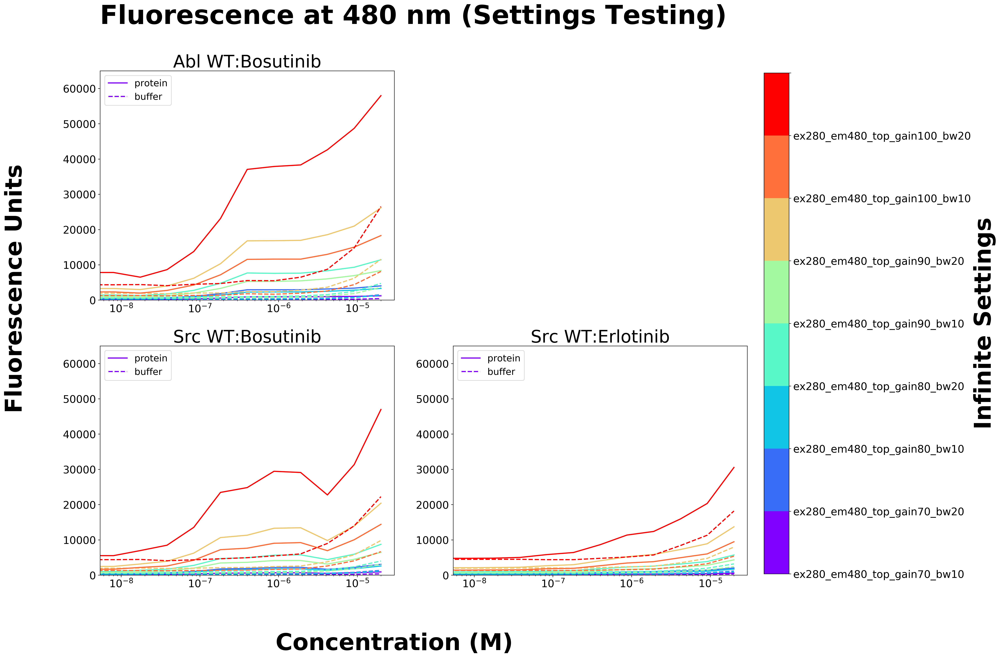

In [6]:
fig = logx_concx(buffer='yes', prot1='Abl WT', prot2='Src WT', lig1='Bosutinib', lig2='Erlotinib', y1_prot=Abl_bos_prot, y1_buff=Abl_bos_buff, y2_prot=Abl_erl_prot, y2_buff=Abl_erl_prot, y3_prot=Src_bos_prot, y3_buff=Src_bos_buff, y4_prot=Src_erl_prot, y4_buff=Src_erl_buff)

### Plot logx without buffer

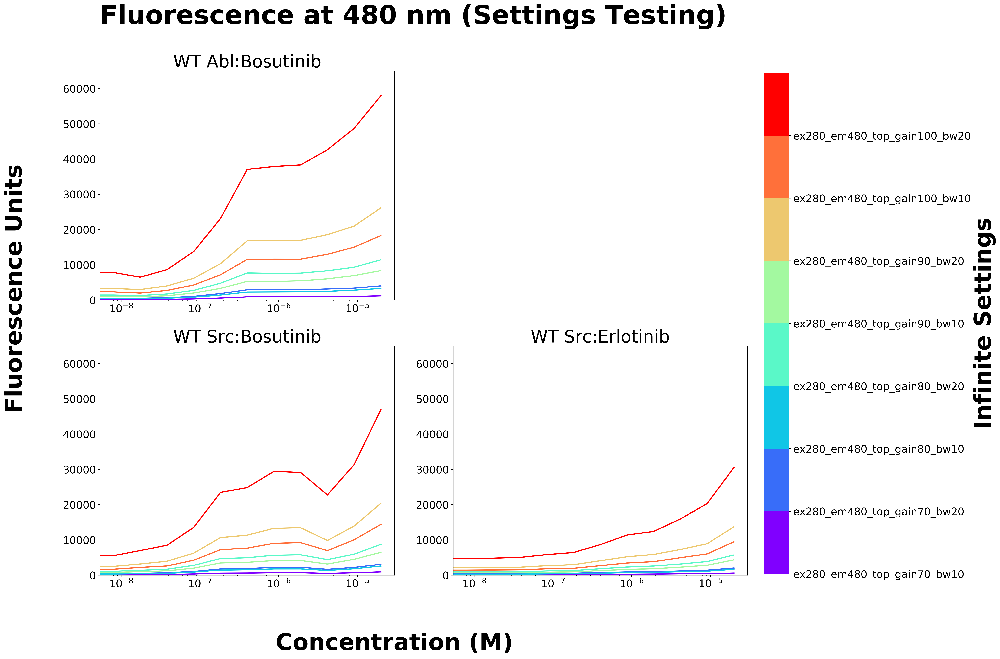

In [7]:
fig = logx_concx(buffer='no', prot1='WT Abl', prot2='WT Src', lig1='Bosutinib', lig2='Erlotinib', y1_prot=Abl_bos_prot, y1_buff=Abl_bos_buff, y2_prot=Abl_erl_prot, y2_buff=Abl_erl_prot, y3_prot=Src_bos_prot, y3_buff=Src_bos_buff, y4_prot=Src_erl_prot, y4_buff=Src_erl_buff)

### Plot loglog with buffer

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit wi

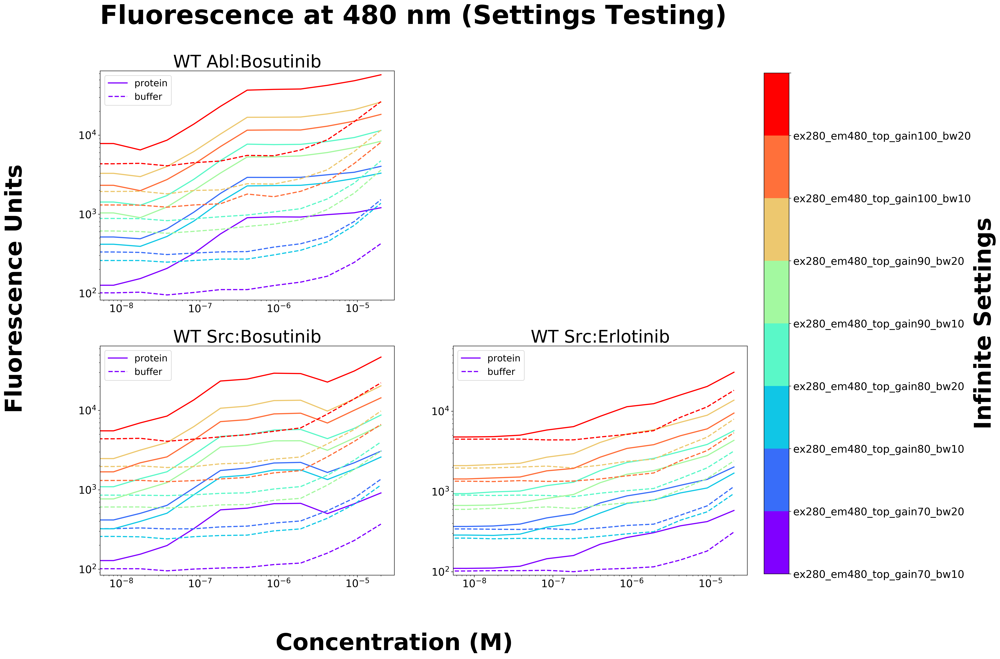

In [8]:
fig = loglog_concx(buffer='yes', prot1='WT Abl', prot2='WT Src', lig1='Bosutinib', lig2='Erlotinib', y1_prot=Abl_bos_prot, y1_buff=Abl_bos_buff, y2_prot=Abl_erl_prot, y2_buff=Abl_erl_prot, y3_prot=Src_bos_prot, y3_buff=Src_bos_buff, y4_prot=Src_erl_prot, y4_buff=Src_erl_buff)

### Plot loglog without buffer

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit wi

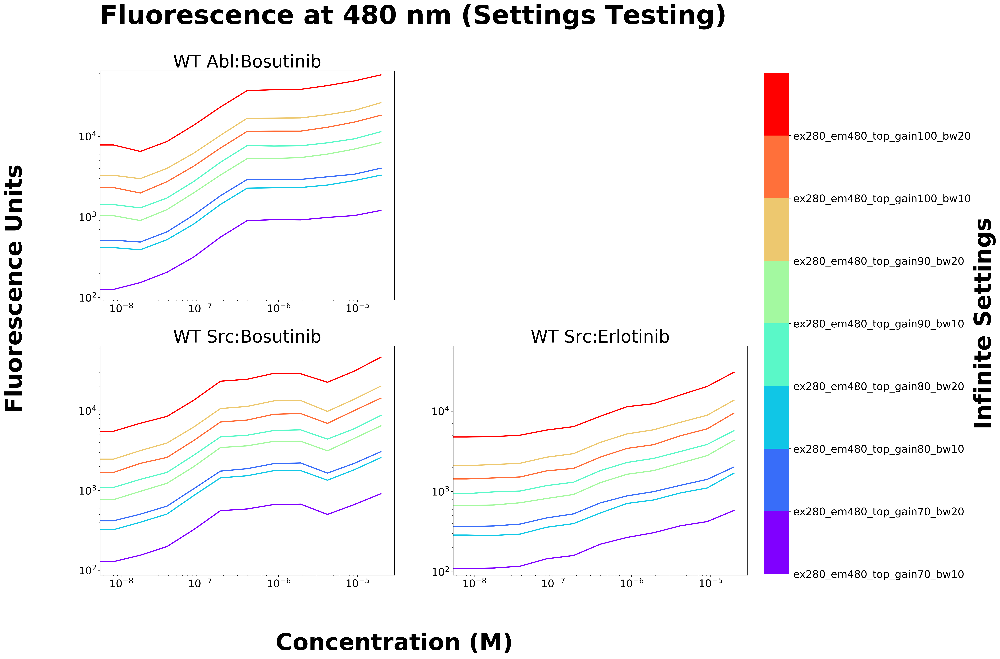

In [9]:
fig = loglog_concx(buffer='no', prot1='WT Abl', prot2='WT Src', lig1='Bosutinib', lig2='Erlotinib', y1_prot=Abl_bos_prot, y1_buff=Abl_bos_buff, y2_prot=Abl_erl_prot, y2_buff=Abl_erl_prot, y3_prot=Src_bos_prot, y3_buff=Src_bos_buff, y4_prot=Src_erl_prot, y4_buff=Src_erl_buff)

# Plot fluo traces over time

## Create more plotting functions

In [10]:
# plot fluo trace across concentrations with colormap of each timepoint, logx with or without ylim

def fluo_trace_logx(ylim, prot, lig, y_prot, y_buff):

    fig,axes = plt.subplots(nrows=2,ncols=4,figsize=(30,20))

    nrows=2
    ncols=4

    index = 0
    for label_index,label in zip(range(len(labels)),labels):
        x_values = concentrations
        color = cm.rainbow(np.linspace(0,1,20))
        ax = plt.subplot(nrows,ncols,index+1)
        for read, c in zip(y_prot[label_index], color):
            plt.semilogx(x_values, np.flip(read), c=c, linestyle='solid', linewidth=2)
        for read, c in zip(y_buff[label_index], color):
            plt.semilogx(x_values, np.flip(read), c=c, linestyle='dotted', linewidth=2)

        plt.xlim(0,3e-5)
        if ylim == 'yes':
            ax.set_ylim(0, 65000)
        else:
            pass
        ax.yaxis.set_tick_params(labelsize=18)
        ax.xaxis.set_tick_params(labelsize=18)
        plt.suptitle('Fluorescence Timecourse: %s & %s' %(prot,lig), fontsize=55, fontweight='bold')
        plt.title('%s' % label, fontsize =20, fontweight='bold')
        anchored_text = AnchoredText('Protein = solid, Buffer = dashed',  loc='upper left', prop=dict(size=14))
        ax.add_artist(anchored_text)

        index += 1

    axis = plt.gca()
    plt.ylabel('Fluorescence Units', fontsize=50, fontweight='bold')
    axis.yaxis.set_label_coords(-3.8,1.25)
    plt.xlabel('Concentration (M)', fontsize=50, fontweight='bold')
    axis.xaxis.set_label_coords(-1.6,-0.2)


    cax = fig.add_axes([.92, 0.127, 0.03, 0.75])

    time = [i for i in range(nreads)] 
    time_mins = [i*5 for i in time]
    time_wait = list()
    for i in time_mins:
        if i > 45:
            i += 15
        time_wait.append(i)
    norm = matplotlib.colors.BoundaryNorm(range(21), cm.rainbow.N)
    cb = matplotlib.colorbar.ColorbarBase(cax, cmap='rainbow', norm=norm, ticks=range(21), boundaries=range(21))
    cb.set_label('Time in Infinite (minutes)', fontsize=35, fontweight='bold')
    cb.ax.tick_params(labelsize=20)
    cb.ax.set_yticklabels(time_wait)

    fig.savefig('20190417_fluo_trace_overtime_%s_%s_ylim_%s_logx.pdf' %(prot,lig,ylim), bbox_inches='tight', dpi=300)

In [11]:
# plot fluo trace across concentrations with colormap of each timepoint, loglog with or without ylim

def fluo_trace_loglog(ylim, prot, lig, y_prot, y_buff):

    fig,axes = plt.subplots(nrows=2,ncols=4,figsize=(30,20))

    nrows=2
    ncols=4

    index = 0
    for label_index,label in zip(range(len(labels)),labels):
        x_values = concentrations
        color = cm.rainbow(np.linspace(0,1,20))
        ax = plt.subplot(nrows,ncols,index+1)
        for read, c in zip(y_prot[label_index], color):
            plt.loglog(x_values, np.flip(read), c=c, linestyle='solid', linewidth=2)
        for read, c in zip(y_buff[label_index], color):
            plt.loglog(x_values, np.flip(read), c=c, linestyle='dotted', linewidth=2)

        plt.xlim(0,3e-5)
        if ylim == 'yes':
            ax.set_ylim(0, 65000)
        else:
            pass
        ax.yaxis.set_tick_params(labelsize=18)
        ax.xaxis.set_tick_params(labelsize=18)
        plt.suptitle('Fluorescence Timecourse: %s & %s' %(prot,lig), fontsize=55, fontweight='bold')
        plt.title('%s' % label, fontsize =20, fontweight='bold')
        anchored_text = AnchoredText('Protein = solid, Buffer = dashed',  loc='upper left', prop=dict(size=14))
        ax.add_artist(anchored_text)

        index += 1

    axis = plt.gca()
    plt.ylabel('Fluorescence Units', fontsize=50, fontweight='bold')
    axis.yaxis.set_label_coords(-3.8,1.25)
    plt.xlabel('Concentration (M)', fontsize=50, fontweight='bold')
    axis.xaxis.set_label_coords(-1.6,-0.2)

    cax = fig.add_axes([.92, 0.127, 0.03, 0.75])

    time = [i for i in range(nreads)] 
    time_mins = [i*5 for i in time]
    time_wait = list()
    for i in time_mins:
        if i > 45:
            i += 15
        time_wait.append(i)
    norm = matplotlib.colors.BoundaryNorm(range(21), cm.rainbow.N)
    cb = matplotlib.colorbar.ColorbarBase(cax, cmap='rainbow', norm=norm, ticks=range(21), boundaries=range(21))
    cb.set_label('Time in Infinite (minutes)', fontsize=35, fontweight='bold')
    cb.ax.tick_params(labelsize=20)
    cb.ax.set_yticklabels(time_wait)

    fig.savefig('20190417_fluo_trace_overtime_%s_%s_ylim_%s_loglog.pdf' %(prot,lig,ylim), bbox_inches='tight', dpi=300)

## Extract data for each fluo trace over timecourse

### Abl WT: Bosutinib

In [12]:
# associate reads with correct well, separate protein and buffer into separate arrays
Abl_bos_prot_time = np.zeros([8, 20, 12], np.float64)
Abl_bos_buff_time = np.zeros([8, 20, 12], np.float64)

ncol = 12

abl_bos_prot_wells = list()
abl_bos_buff_wells = list()
for well in range(ncol):
    index = well + 1
    prot_well_name = 'A%s' % index
    buff_well_name = 'B%s' % index
    abl_bos_prot_wells.append(prot_well_name)
    abl_bos_buff_wells.append(buff_well_name)

index = 0

for label_index,label in zip(range(len(labels)),labels):
    measurements_prot = list([[reads[x][label][j] for j in abl_bos_prot_wells] for x in range(nreads)])
    measurements_buff = list([[reads[x][label][j] for j in abl_bos_buff_wells] for x in range(nreads)])
    for x in range(nreads):
        measurements_prot[x] = [i if i != 'OVER' else 70000 for i in measurements_prot[x]]
        measurements_buff[x] = [i if i != 'OVER' else 70000 for i in measurements_buff[x]]
    Abl_bos_prot_time[label_index] = np.array(measurements_prot)
    Abl_bos_buff_time[label_index] = np.array(measurements_buff)

index += 1

### Plot logx fluo trace for Abl WT & Bosutinib

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib

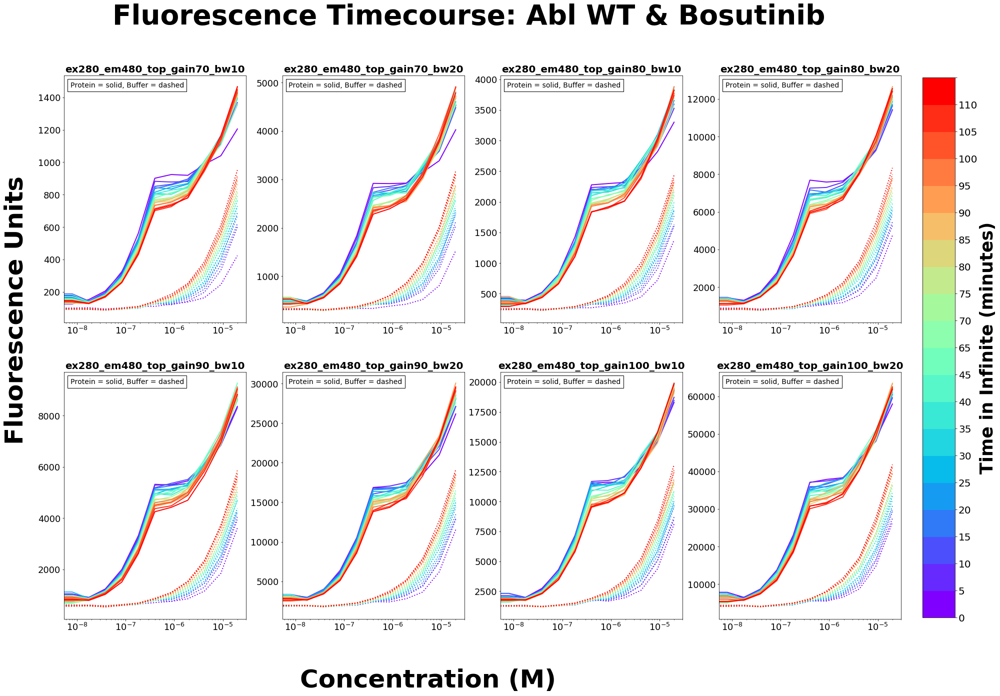

In [13]:
fig = fluo_trace_logx(ylim='no', prot='Abl WT', lig='Bosutinib', y_prot=Abl_bos_prot_time, y_buff=Abl_bos_buff_time)

### Plot logx fluo trace with ylim for Abl WT & Bosutinib

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib

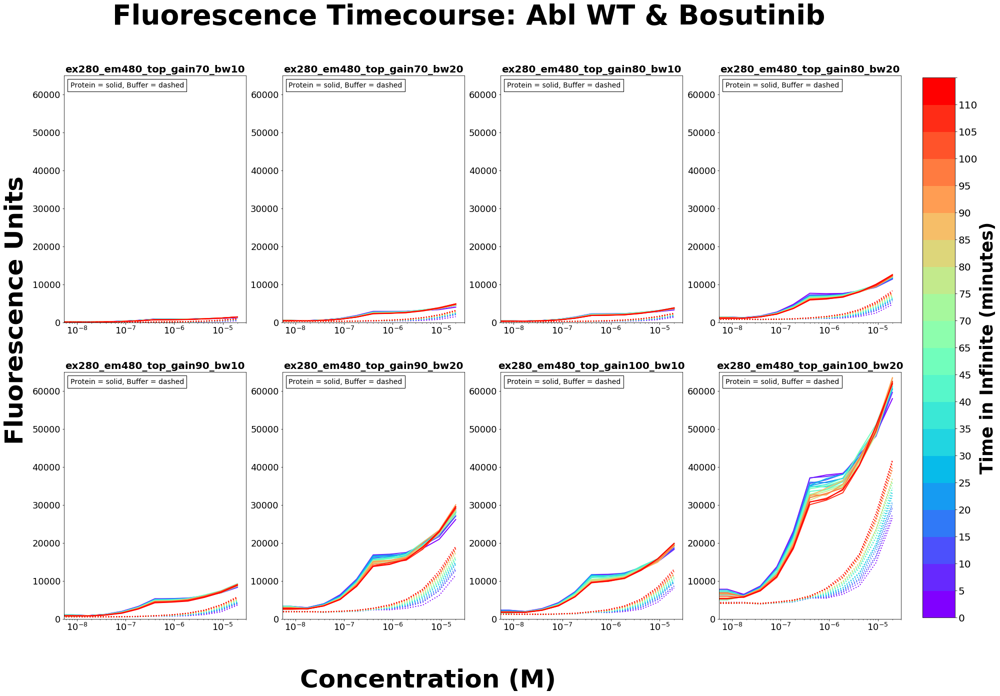

In [14]:
fig = fluo_trace_logx(ylim='yes', prot='Abl WT', lig='Bosutinib', y_prot=Abl_bos_prot_time, y_buff=Abl_bos_buff_time)

### Plot loglog fluo trace for Abl WT & Bosutinib

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib

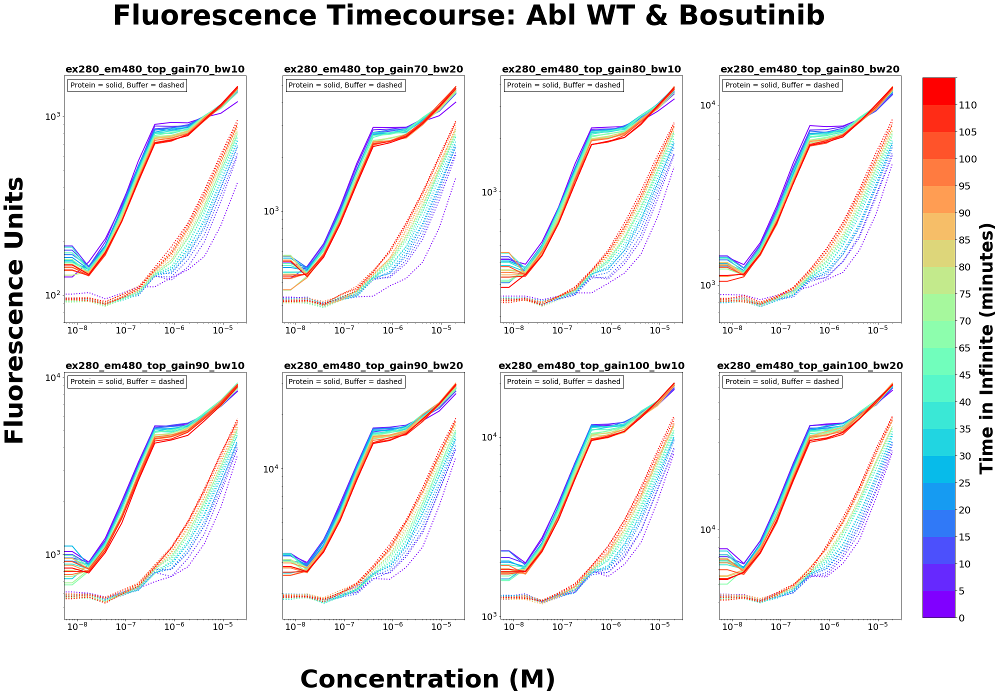

In [15]:
fig = fluo_trace_loglog(ylim='no', prot='Abl WT', lig='Bosutinib', y_prot=Abl_bos_prot_time, y_buff=Abl_bos_buff_time)

### Plot loglog fluo trace w/ ylim for Abl WT & Bosutinib

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:22: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:22: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempt

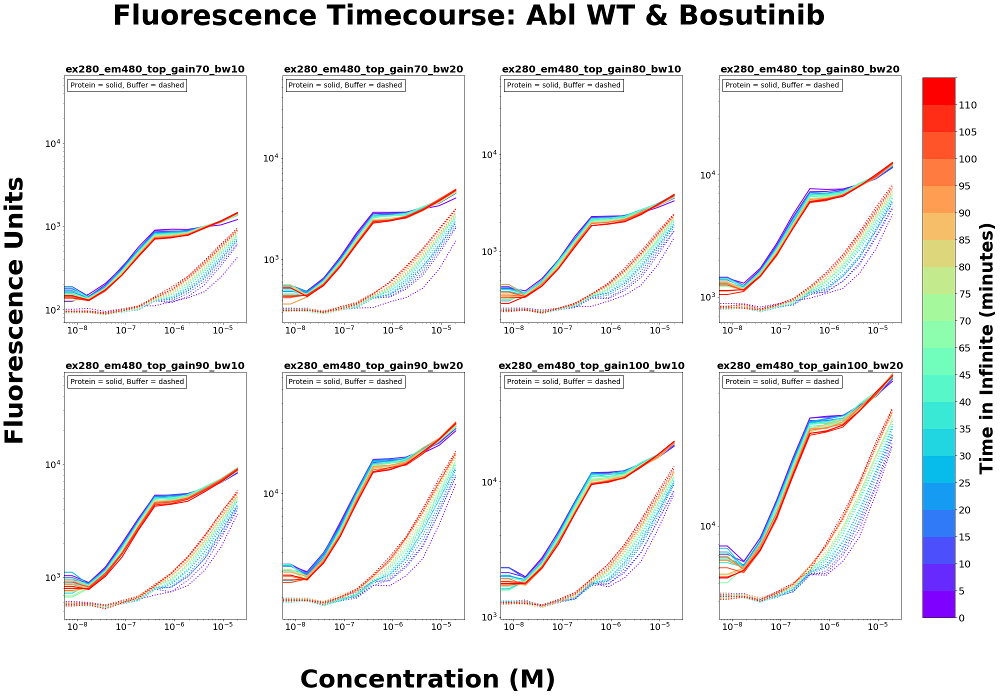

In [16]:
fig = fluo_trace_loglog(ylim='yes', prot='Abl WT', lig='Bosutinib', y_prot=Abl_bos_prot_time, y_buff=Abl_bos_buff_time)

### Src WT: Bosutinib

In [17]:
# associate reads with correct well, separate protein and buffer into separate arrays
Src_bos_prot_time = np.zeros([8, 20, 12], np.float64)
Src_bos_buff_time = np.zeros([8, 20, 12], np.float64)

ncol = 12

src_bos_prot_wells = list()
src_bos_buff_wells = list()
for well in range(ncol):
    index = well + 1
    prot_well_name = 'E%s' % index
    buff_well_name = 'F%s' % index
    src_bos_prot_wells.append(prot_well_name)
    src_bos_buff_wells.append(buff_well_name)

index = 0

for label_index,label in zip(range(len(labels)),labels):
    measurements_prot = list([[reads[x][label][j] for j in src_bos_prot_wells] for x in range(nreads)])
    measurements_buff = list([[reads[x][label][j] for j in src_bos_buff_wells] for x in range(nreads)])
    for x in range(nreads):
        measurements_prot[x] = [i if i != 'OVER' else 70000 for i in measurements_prot[x]]
        measurements_buff[x] = [i if i != 'OVER' else 70000 for i in measurements_buff[x]]
    Src_bos_prot_time[label_index] = np.array(measurements_prot)
    Src_bos_buff_time[label_index] = np.array(measurements_buff)
    
index += 1

### Plot logx fluo trace for WT Src & Bosutinib

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib

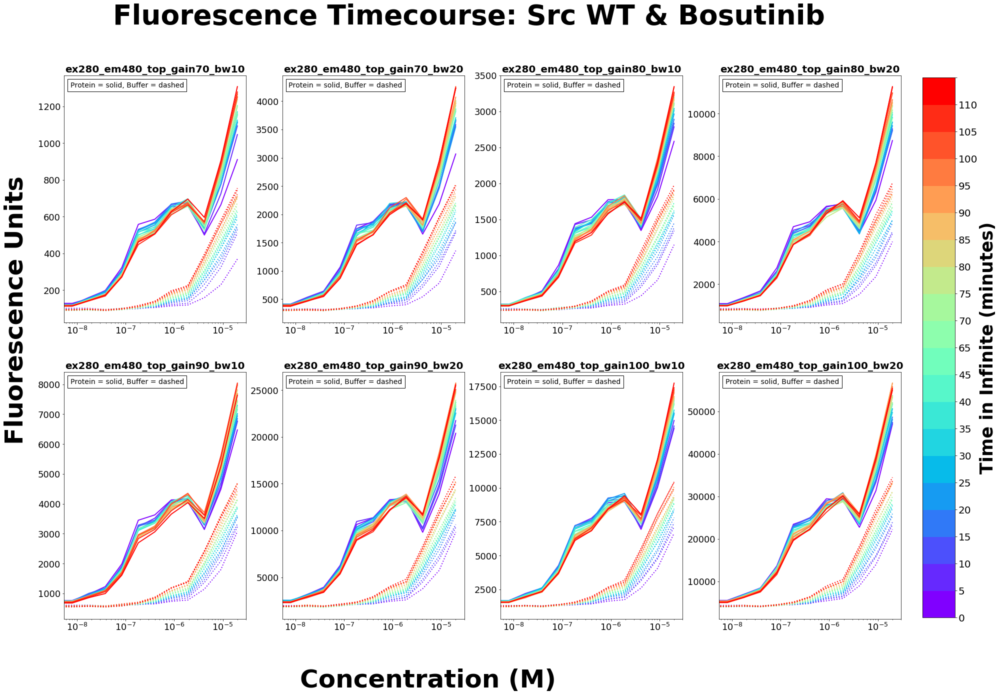

In [18]:
fig = fluo_trace_logx(ylim='no', prot='Src WT', lig='Bosutinib', y_prot=Src_bos_prot_time, y_buff=Src_bos_buff_time)

### Plot logx fluo trace w/ ylim for WT Src & Bosutinib

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib

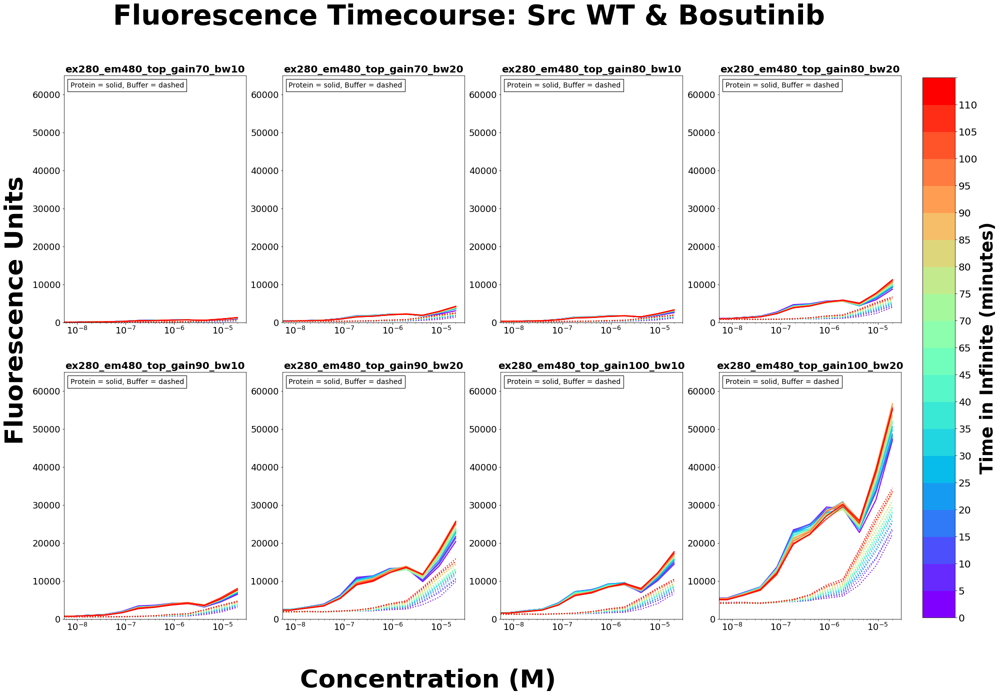

In [19]:
fig = fluo_trace_logx(ylim='yes', prot='Src WT', lig='Bosutinib', y_prot=Src_bos_prot_time, y_buff=Src_bos_buff_time)

### Plot loglog fluo trace for WT Src & Bosutinib

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib

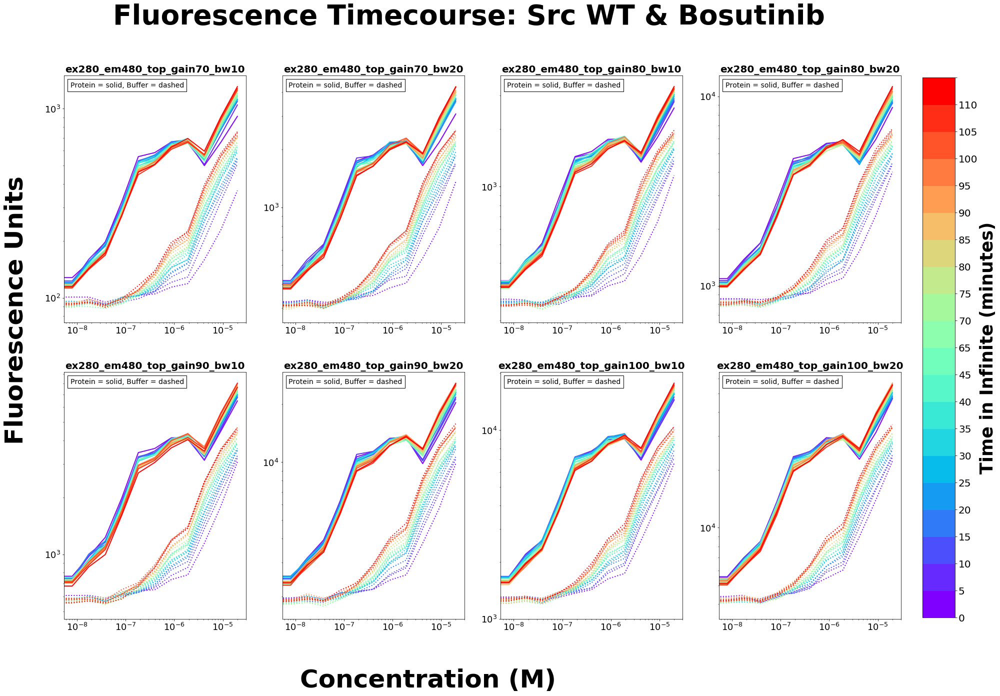

In [20]:
fig = fluo_trace_loglog(ylim='no', prot='Src WT', lig='Bosutinib', y_prot=Src_bos_prot_time, y_buff=Src_bos_buff_time)

### Plot loglog fluo trace w/ ylim for WT Src & Bosutinib

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:22: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:22: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempt

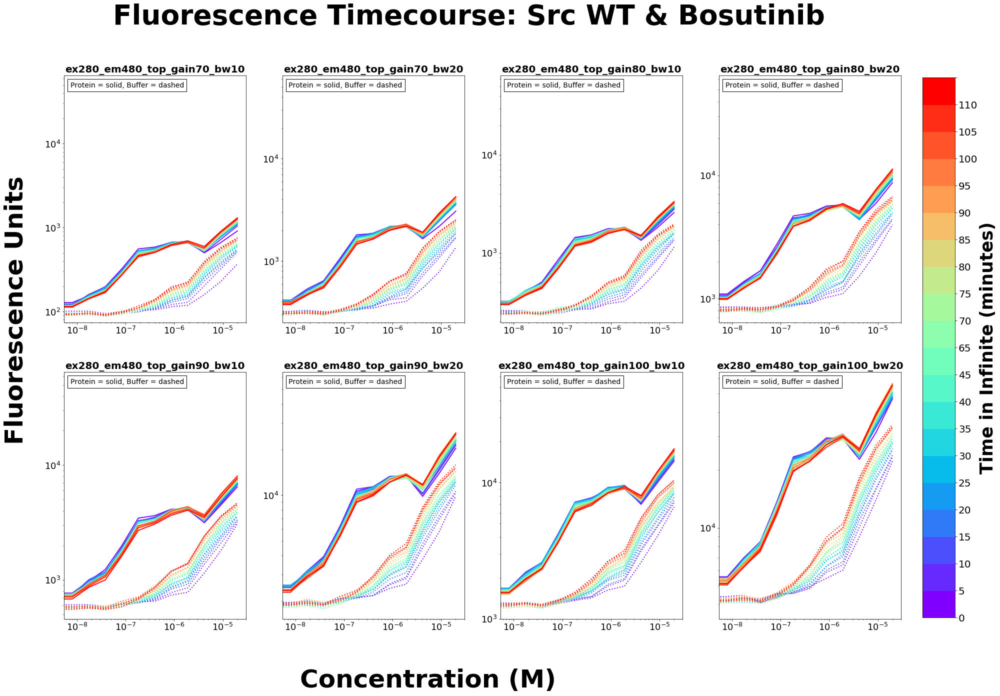

In [21]:
fig = fluo_trace_loglog(ylim='yes', prot='Src WT', lig='Bosutinib', y_prot=Src_bos_prot_time, y_buff=Src_bos_buff_time)

### WT Src: Erlotinib

In [22]:
# associate reads with correct well, separate protein and buffer into separate arrays
Src_erl_prot_time = np.zeros([8, 20, 12], np.float64)
Src_erl_buff_time = np.zeros([8, 20, 12], np.float64)

ncol = 12

src_erl_prot_wells = list()
src_erl_buff_wells = list()
for well in range(ncol):
    index = well + 1
    prot_well_name = 'G%s' % index
    buff_well_name = 'H%s' % index
    src_erl_prot_wells.append(prot_well_name)
    src_erl_buff_wells.append(buff_well_name)
    

index = 0

for label_index,label in zip(range(len(labels)),labels):
    measurements_prot = list([[reads[x][label][j] for j in src_erl_prot_wells] for x in range(nreads)])
    measurements_buff = list([[reads[x][label][j] for j in src_erl_buff_wells] for x in range(nreads)])
    for x in range(nreads):
        measurements_prot[x] = [i if i != 'OVER' else 70000 for i in measurements_prot[x]]
        measurements_buff[x] = [i if i != 'OVER' else 70000 for i in measurements_buff[x]]
    Src_erl_prot_time[label_index] = np.array(measurements_prot)
    Src_erl_buff_time[label_index] = np.array(measurements_buff)

index += 1

### Plot logx fluo trace for Src WT & Erlotinib

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib

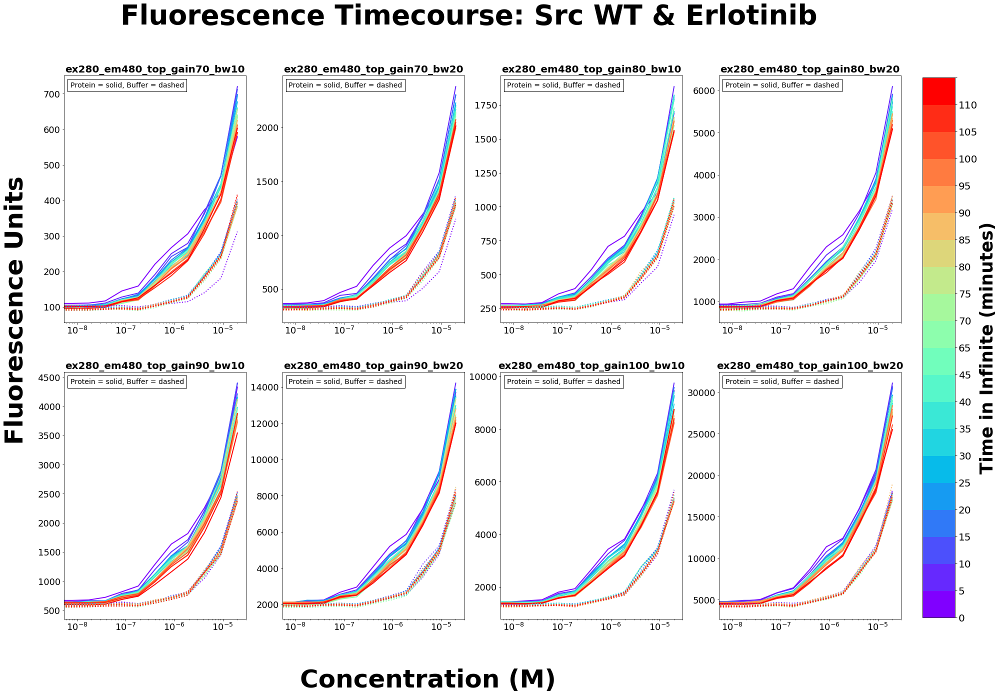

In [23]:
fig = fluo_trace_logx(ylim='no', prot='Src WT', lig='Erlotinib', y_prot=Src_erl_prot_time, y_buff=Src_erl_buff_time)

### Plot logx fluo trace w/ ylim for Src WT & Erlotinib

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib

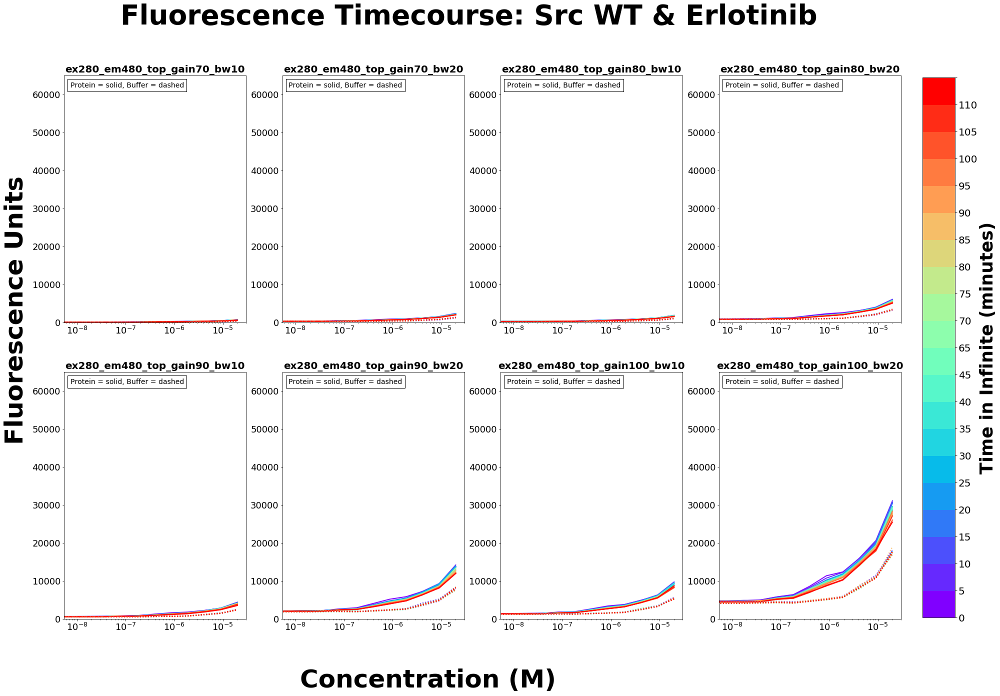

In [24]:
fig = fluo_trace_logx(ylim='yes', prot='Src WT', lig='Erlotinib', y_prot=Src_erl_prot_time, y_buff=Src_erl_buff_time)

### Plot loglog fluo trace for Src WT & Erlotinib

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib

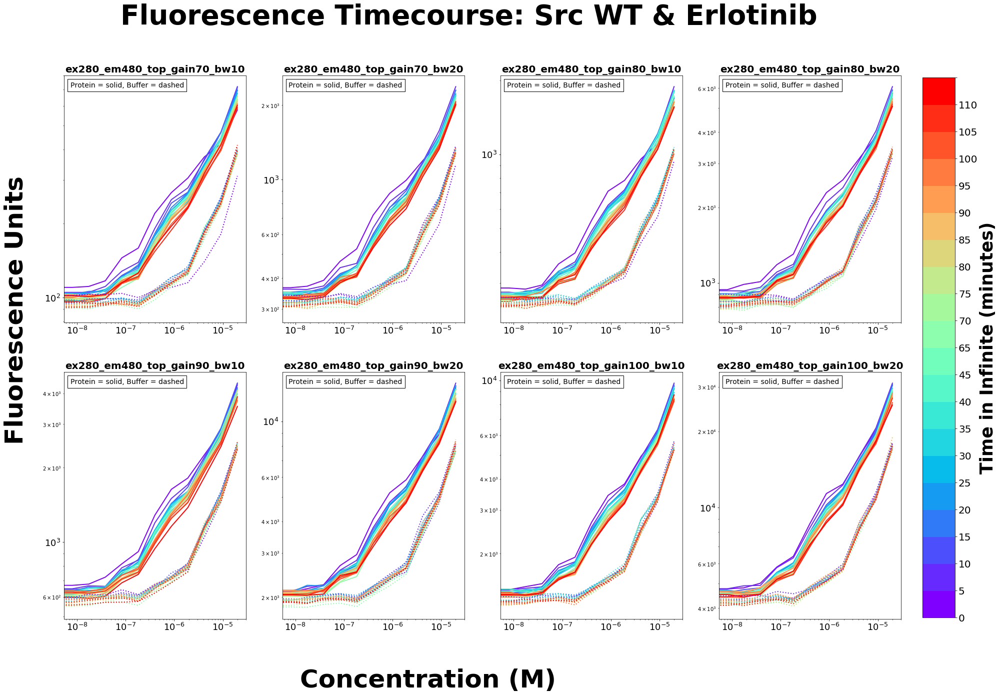

In [25]:
fig = fluo_trace_loglog(ylim='no', prot='Src WT', lig='Erlotinib', y_prot=Src_erl_prot_time, y_buff=Src_erl_buff_time)

### Plot loglog fluo trace w/ ylim for Src WT & Erlotinib

/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:22: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_xlim(*args, **kwargs)
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/ipykernel_launcher.py:22: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Applications/miniconda3/envs/assaytools/lib/python3.6/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempt

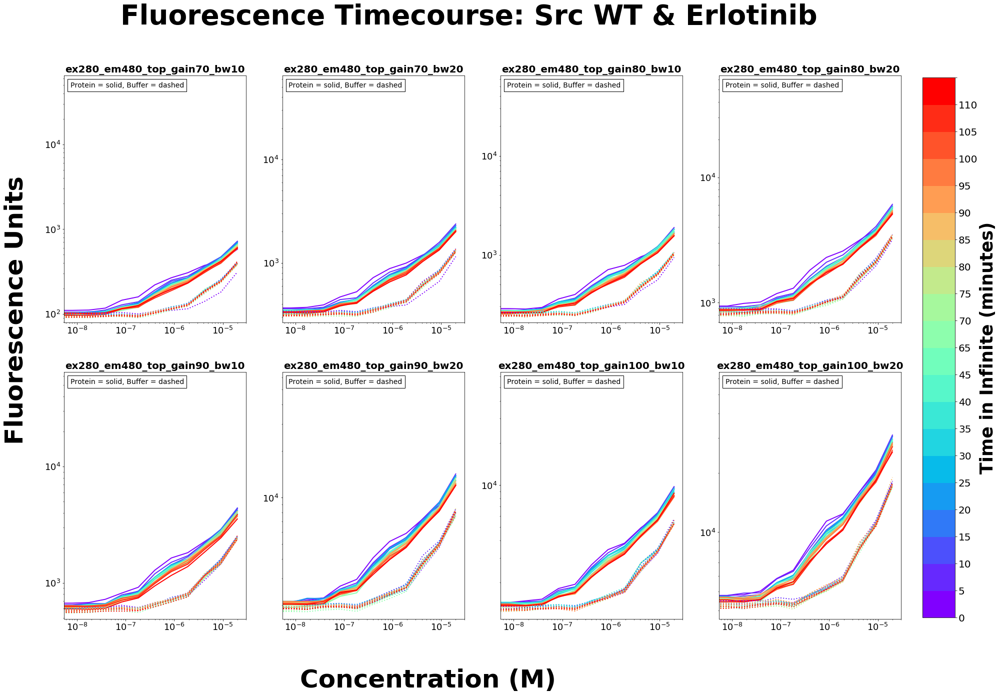

In [26]:
fig = fluo_trace_loglog(ylim='yes', prot='Src WT', lig='Erlotinib', y_prot=Src_erl_prot_time, y_buff=Src_erl_buff_time)

## Extract and plot data according to time rather than concentration

## Create more plotting functions

In [27]:
# plot fluo values across time with colormap of each concentration 

def fluo_time_plot(prot, lig, y_prot, y_buff):
    
    time = [i for i in range(nreads)] 
    time_mins = list([i*5 for i in time])

    fig,axes = plt.subplots(nrows=2,ncols=4,figsize=(30,20))

    # ncol = 12
    nrows=2
    ncols=4

    index = 0
    for label_index,label in zip(range(len(labels)),labels):
        x_values_time = time_mins
        color = cm.rainbow(np.linspace(0,1,12))
        conc_color = np.flip(color)
        ax = plt.subplot(nrows,ncols,index+1)
        for read, c in zip(y_prot[label_index], color):
            plt.plot(x_values_time, read, c=c, linestyle='solid', linewidth=2)
        for read, c in zip(y_buff[label_index], color):
            plt.plot(x_values_time, read, c=c, linestyle='dotted', linewidth=2)

        ax.yaxis.set_tick_params(labelsize=18)
        ax.xaxis.set_tick_params(labelsize=18)
        plt.suptitle('Fluorescence Timecourse: %s & %s' %(prot,lig), fontsize=55, fontweight='bold')
        plt.title('%s' % label, fontsize =15, fontweight='bold')
        anchored_text = AnchoredText('Protein = solid\n Buffer = dashed',  loc='upper left', prop=dict(size=10))
        ax.add_artist(anchored_text)

        index += 1

    axis = plt.gca()
    plt.ylabel('Fluorescence Units', fontsize=50, fontweight='bold')
    axis.yaxis.set_label_coords(-3.8,1.25)
    plt.xlabel('Time (mins)', fontsize=50, fontweight='bold')
    axis.xaxis.set_label_coords(-1.2,-0.1)

    cax = fig.add_axes([.92, 0.127, 0.03, 0.75])

    micro_concentrations = np.multiply(concentrations, 1e6)
    norm = matplotlib.colors.BoundaryNorm(micro_concentrations, cm.rainbow.N)
    conc_labels = ['{0:.3f}'.format(x) for x in micro_concentrations]
    cb = matplotlib.colorbar.ColorbarBase(cax, cmap='rainbow', norm=norm, ticks=micro_concentrations, boundaries=micro_concentrations)
    cb.set_label('Ligand Concentration ($\mu$M)', fontsize=35, fontweight='bold')
    cb.ax.tick_params(labelsize=25)
    cb.ax.set_yticklabels(conc_labels)


    fig.savefig('20190417_well_values_overtime_%s_%s.pdf' %(prot,lig) , bbox_inches='tight', dpi=300)

In [28]:
# plot fluo values across time with colormap of each concentration, logy 

def fluo_time_logy(prot, lig, y_prot, y_buff):
    
    time = [i for i in range(nreads)] 
    time_mins = list([i*5 for i in time])

    fig,axes = plt.subplots(nrows=2,ncols=4,figsize=(30,20))

    # ncol = 12
    nrows=2
    ncols=4

    index = 0
    for label_index,label in zip(range(len(labels)),labels):
        x_values_time = time_mins
        color = cm.rainbow(np.linspace(0,1,12))
        conc_color = np.flip(color)
        ax = plt.subplot(nrows,ncols,index+1)
        for read, c in zip(y_prot[label_index], color):
            plt.semilogy(x_values_time, read, c=c, linestyle='solid', linewidth=2)
        for read, c in zip(y_buff[label_index], color):
            plt.semilogy(x_values_time, read, c=c, linestyle='dotted', linewidth=2)

        ax.yaxis.set_tick_params(labelsize=18)
        ax.xaxis.set_tick_params(labelsize=18)
        plt.suptitle('Fluorescence Timecourse: %s & %s' %(prot,lig), fontsize=55, fontweight='bold')
        plt.title('%s' % label, fontsize =15, fontweight='bold')
        anchored_text = AnchoredText('Protein = solid\n Buffer = dashed',  loc='upper left', prop=dict(size=10))
        ax.add_artist(anchored_text)

        index += 1

    axis = plt.gca()
    plt.ylabel('Fluorescence Units', fontsize=50, fontweight='bold')
    axis.yaxis.set_label_coords(-3.8,1.25)
    plt.xlabel('Time (mins)', fontsize=50, fontweight='bold')
    axis.xaxis.set_label_coords(-1.2,-0.1)

    cax = fig.add_axes([.92, 0.127, 0.03, 0.75])

    micro_concentrations = np.multiply(concentrations, 1e6)
    norm = matplotlib.colors.BoundaryNorm(micro_concentrations, cm.rainbow.N)
    conc_labels = ['{0:.3f}'.format(x) for x in micro_concentrations]
    cb = matplotlib.colorbar.ColorbarBase(cax, cmap='rainbow', norm=norm, ticks=micro_concentrations, boundaries=micro_concentrations)
    cb.set_label('Ligand Concentration ($\mu$M)', fontsize=35, fontweight='bold')
    cb.ax.tick_params(labelsize=25)
    cb.ax.set_yticklabels(conc_labels)


    fig.savefig('20190417_well_values_overtime_%s_%s_logy.pdf' %(prot,lig) , bbox_inches='tight', dpi=300)

## WT Abl: Bosutinib

In [29]:
# associate reads with correct well, separate protein and buffer into separate arrays
Abl_bos_prot_timex = np.zeros([8, 12, 20], np.float64)
Abl_bos_buff_timex = np.zeros([8, 12, 20], np.float64)

ncol = 12

abl_bos_prot_wells = list()
abl_bos_buff_wells = list()
for well in range(ncol):
    index = well + 1
    prot_well_name = 'A%s' % index
    buff_well_name = 'B%s' % index
    abl_bos_prot_wells.append(prot_well_name)
    abl_bos_buff_wells.append(buff_well_name)

index = 0

for label_index,label in zip(range(len(labels)),labels):
    measurements_prot = list([[reads[x][label][j] for x in range(nreads)] for j in reversed(abl_bos_prot_wells)])
    measurements_buff = list([[reads[x][label][j] for x in range(nreads)] for j in reversed(abl_bos_buff_wells)])
    for x in range(len(abl_bos_prot_wells)):
        measurements_prot[x] = [i if i != 'OVER' else 70000 for i in measurements_prot[x]]
        measurements_buff[x] = [i if i != 'OVER' else 70000 for i in measurements_buff[x]]
    Abl_bos_prot_timex[label_index] = np.array(measurements_prot)
    Abl_bos_buff_timex[label_index] = np.array(measurements_buff)

    index += 1


### Plot well values overtime for Abl WT & Bosutinib

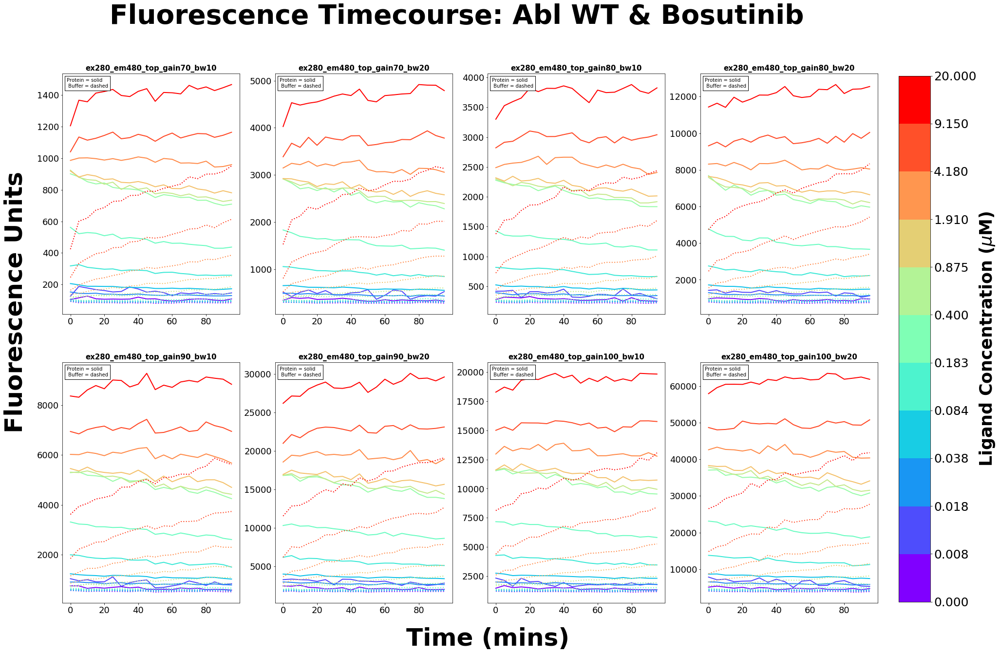

In [30]:
fig = fluo_time_plot(prot='Abl WT', lig='Bosutinib', y_prot=Abl_bos_prot_timex, y_buff=Abl_bos_buff_timex)

### Plot logy well values overtime for Abl WT & Bosutinib

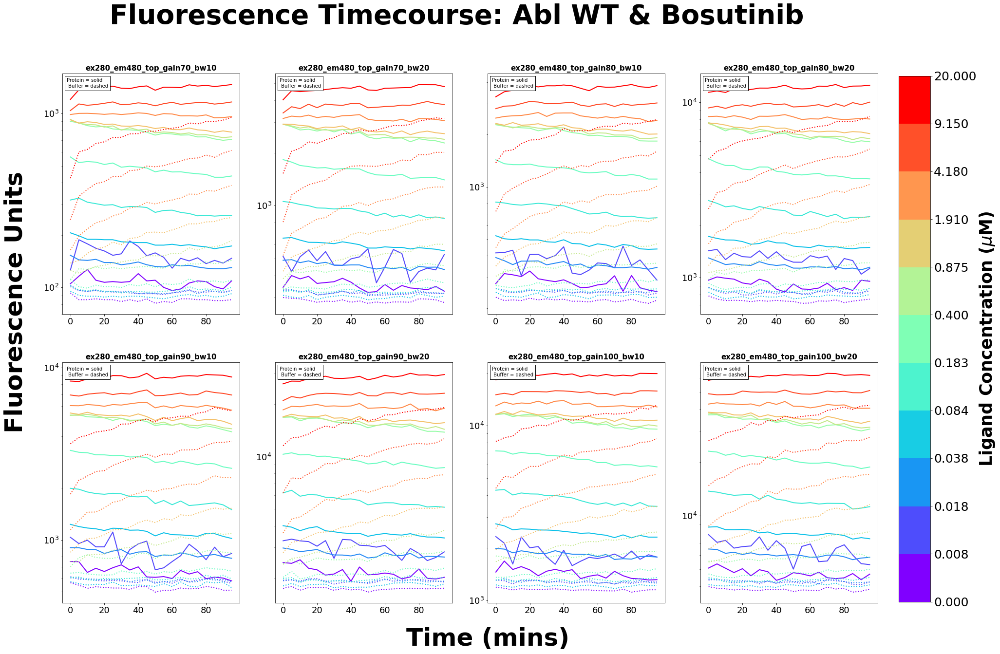

In [31]:
fig = fluo_time_logy(prot='Abl WT', lig='Bosutinib', y_prot=Abl_bos_prot_timex, y_buff=Abl_bos_buff_timex)

In [32]:
# associate reads with correct well, separate protein and buffer into separate arrays
Src_bos_prot_timex = np.zeros([8, 12, 20], np.float64)
Src_bos_buff_timex = np.zeros([8, 12, 20], np.float64)

ncol = 12

src_bos_prot_wells = list()
src_bos_buff_wells = list()
for well in range(ncol):
    index = well + 1
    prot_well_name = 'E%s' % index
    buff_well_name = 'F%s' % index
    src_bos_prot_wells.append(prot_well_name)
    src_bos_buff_wells.append(buff_well_name)

index = 0

for label_index,label in zip(range(len(labels)),labels):
    measurements_prot = list([[reads[x][label][j] for x in range(nreads)] for j in reversed(src_bos_prot_wells)])
    measurements_buff = list([[reads[x][label][j] for x in range(nreads)] for j in reversed(src_bos_buff_wells)])
    for x in range(len(src_bos_prot_wells)):
        measurements_prot[x] = [i if i != 'OVER' else 70000 for i in measurements_prot[x]]
        measurements_buff[x] = [i if i != 'OVER' else 70000 for i in measurements_buff[x]]
    Src_bos_prot_timex[label_index] = np.array(measurements_prot)
    Src_bos_buff_timex[label_index] = np.array(measurements_buff)
    
    index += 1

### Plot well values overtime for Src WT & Bosutinib

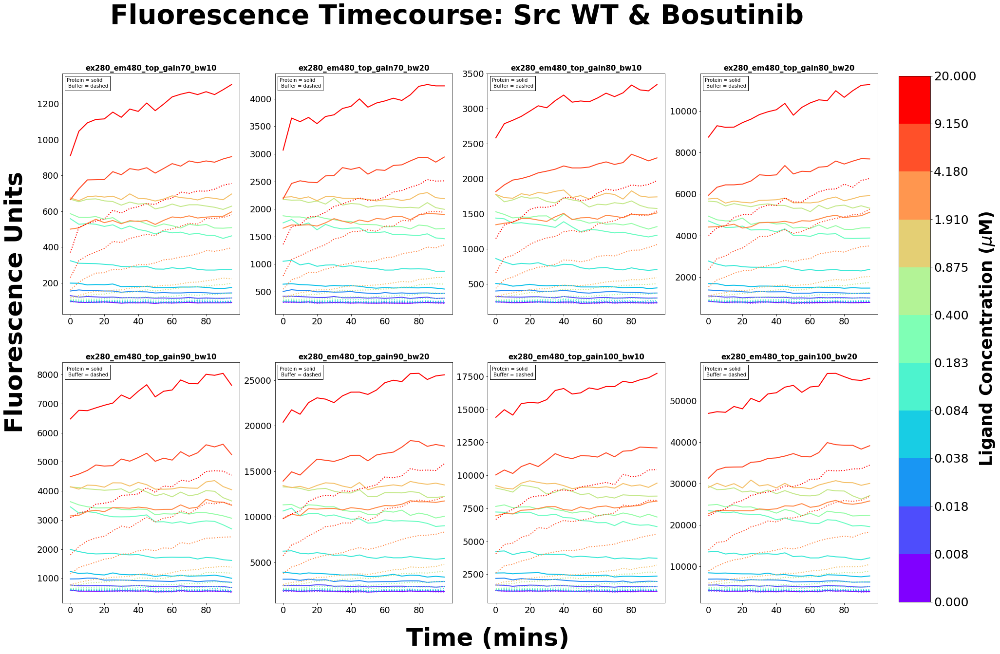

In [33]:
fig = fluo_time_plot(prot='Src WT', lig='Bosutinib', y_prot=Src_bos_prot_timex, y_buff=Src_bos_buff_timex)

### Plot logy well values overtime for Src WT & Bosutinib

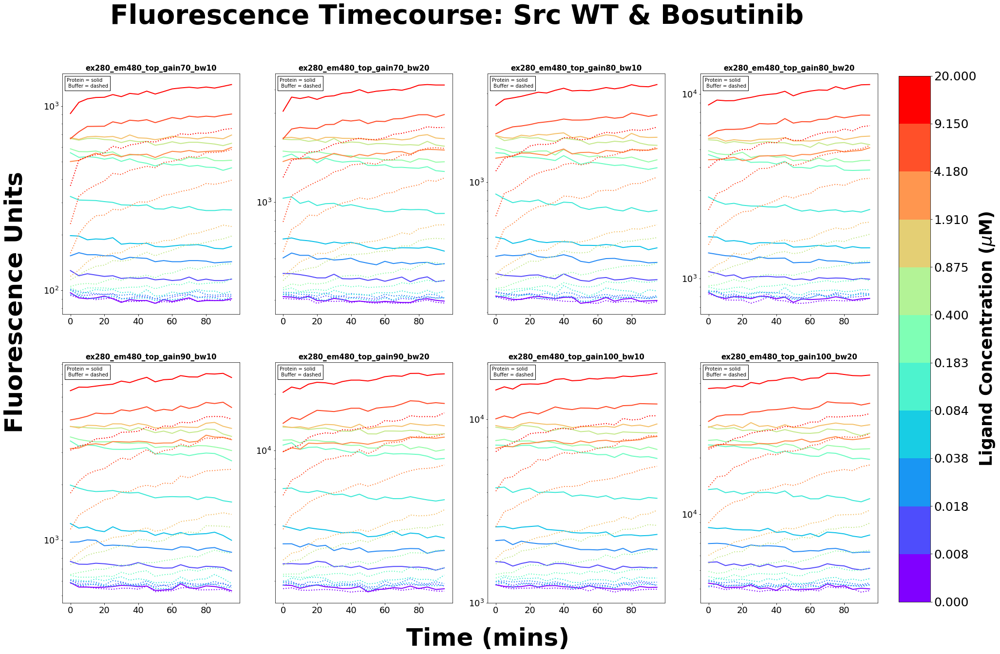

In [34]:
fig = fluo_time_logy(prot='Src WT', lig='Bosutinib', y_prot=Src_bos_prot_timex, y_buff=Src_bos_buff_timex)

In [35]:
# associate reads with correct well, separate protein and buffer into separate arrays
Src_erl_prot_timex = np.zeros([8, 12, 20], np.float64)
Src_erl_buff_timex = np.zeros([8, 12, 20], np.float64)

ncol = 12

src_erl_prot_wells = list()
src_erl_buff_wells = list()
for well in range(ncol):
    index = well + 1
    prot_well_name = 'G%s' % index
    buff_well_name = 'H%s' % index
    src_erl_prot_wells.append(prot_well_name)
    src_erl_buff_wells.append(buff_well_name)

index = 0

for label_index,label in zip(range(len(labels)),labels):
    measurements_prot = list([[reads[x][label][j] for x in range(nreads)] for j in reversed(src_erl_prot_wells)])
    measurements_buff = list([[reads[x][label][j] for x in range(nreads)] for j in reversed(src_erl_buff_wells)])
    for x in range(len(src_bos_prot_wells)):
        measurements_prot[x] = [i if i != 'OVER' else 70000 for i in measurements_prot[x]]
        measurements_buff[x] = [i if i != 'OVER' else 70000 for i in measurements_buff[x]]
    Src_erl_prot_timex[label_index] = np.array(measurements_prot)
    Src_erl_buff_timex[label_index] = np.array(measurements_buff)

    index += 1

### Plot well values overtime for Src WT & Erlotinib

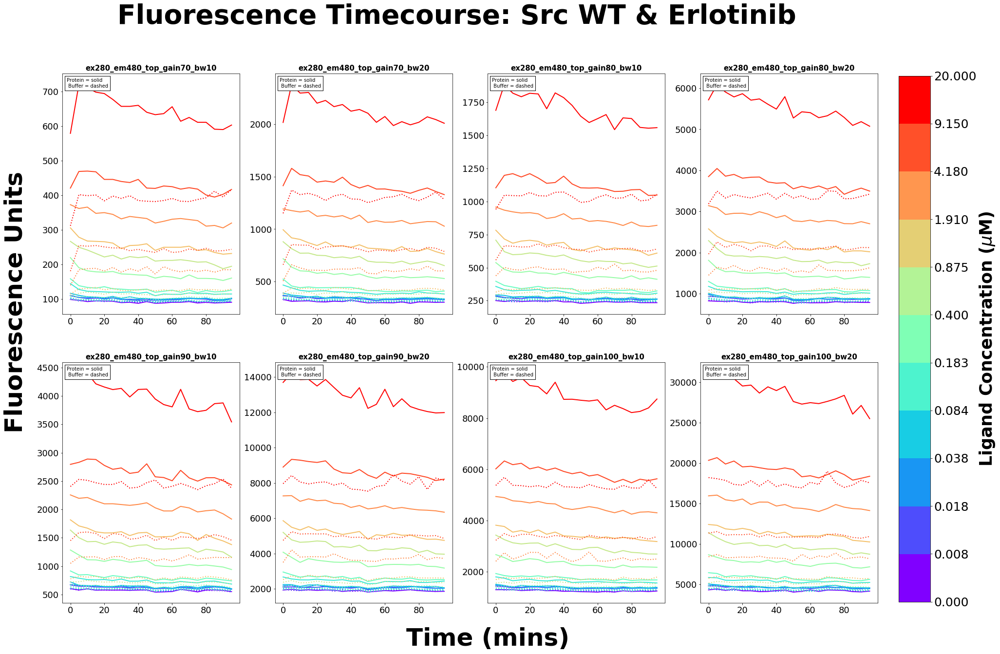

In [36]:
fig = fluo_time_plot(prot='Src WT', lig='Erlotinib', y_prot=Src_erl_prot_timex, y_buff=Src_erl_buff_timex)

### Plot logy well values overtime for Src WT & Erlotinib

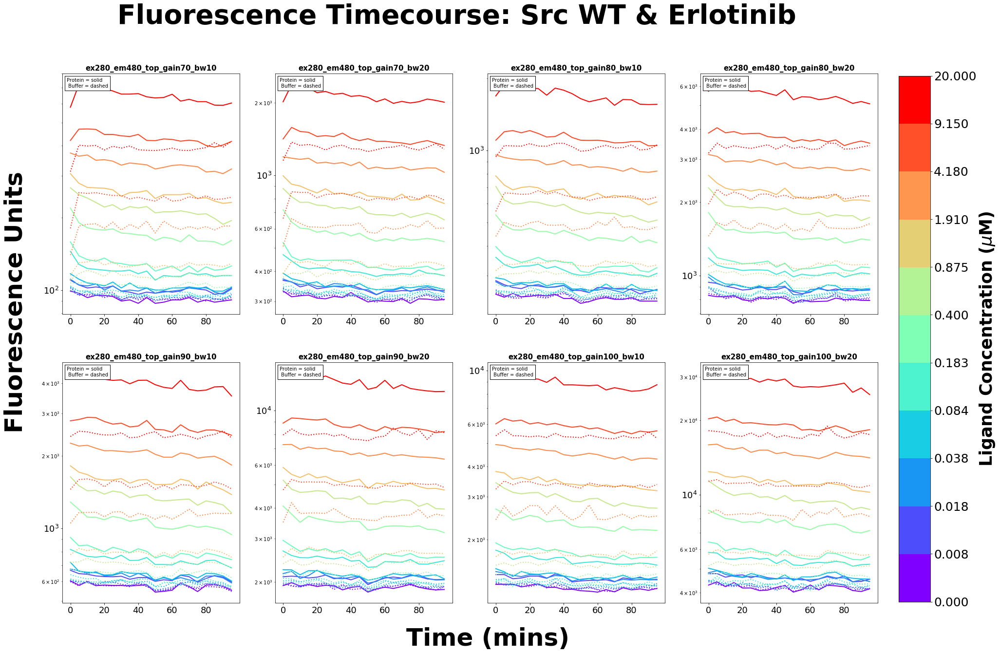

In [37]:
fig = fluo_time_logy(prot='Src WT', lig='Erlotinib', y_prot=Src_erl_prot_timex, y_buff=Src_erl_buff_timex)